## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using the provided chessboard images

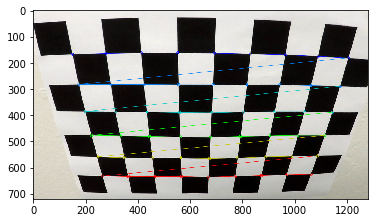

In [7]:
#THIS SECTION IS MEANT TO READ IN AN IMAGE AND TO CHECK (MANUALLY) SOME OF THE DETECTED CORNERS IN THE IMAGES

import numpy as np
import cv2
import matplotlib.image as mpimg
import glob
import matplotlib.pyplot as plt
# %matplotlib qt ------------TO VERIFY WHY IT WAS KILLING THE KERNEL---------


#Read in only one image as a first test to retrieve the corners of the image and plot them
single_image = mpimg.imread('camera_cal/calibration2.jpg')
#plt.imshow(single_image) 

#Here I am counting all the inside corners of the chessboard on the x and y axis
corners_x = 9
corners_y = 6

#Converting the image to grayscale paying attention on which method I used to import the image
gray_image = cv2.cvtColor(single_image, cv2.COLOR_BGR2GRAY)

#Here I use the open CV function to compute the corners of the image
test_ret, test_corners = cv2.findChessboardCorners(gray_image, (corners_x, corners_y), None)

# If found, plot the corners on the original image
if test_ret == True:
    cv2.drawChessboardCorners(single_image, (corners_x, corners_y), test_corners, test_ret)
    plt.imshow(single_image)

In [2]:
#FUNCTIONS DEFINITION

#Function useful to un-distort the image using the parameters obtained from the camera calibration
def remove_img_distortion(img, obj_points, img_points):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, img.shape[1::-1], None, None)
    undistorted_image = cv2.undistort(img, mtx, dist, None, mtx)
    return undistorted_image

def plot_orig_and_undistorted(original_img, undistorted_img, img_index=0):
    plt.figure(img_index)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(original_img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted_img)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return f

In [3]:
#THIS SECTION IS MEANT TO READ IN ALL THE CALIBRATION IMAGES AND TO COMPUTE THE VECTORS NECESSARY TO CALIBRATE THE CAMERA

calibration_images = glob.glob('camera_cal/calibration*.jpg')

#3D coordinates (x,y,z) with the z = 0 for every point
obj_points = np.zeros((corners_x*corners_y,3), np.float32)
#Shape back into two columns (x,y) coordinates and use the mgrid function
#The object points will be the same for all the images under test
obj_points[:,:2] = np.mgrid[0:corners_x,0:corners_y].T.reshape(-1,2) 

#Arrays preparation where I will save object points and all image points from all the images under test.
final_obj_points = [] # 3d points in real world space
final_img_points = [] # 2d points in image plane.

# Step through the list and search for chessboard corners
for current_image in calibration_images:
    img = cv2.imread(current_image)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    img_shape = gray.shape[::-1]
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (corners_x,corners_y), None)

    # If found, add object points, image points
    if ret == True:
        final_obj_points.append(obj_points)
        final_img_points.append(corners)
        cv2.drawChessboardCorners(img, (corners_x, corners_y), corners, ret)


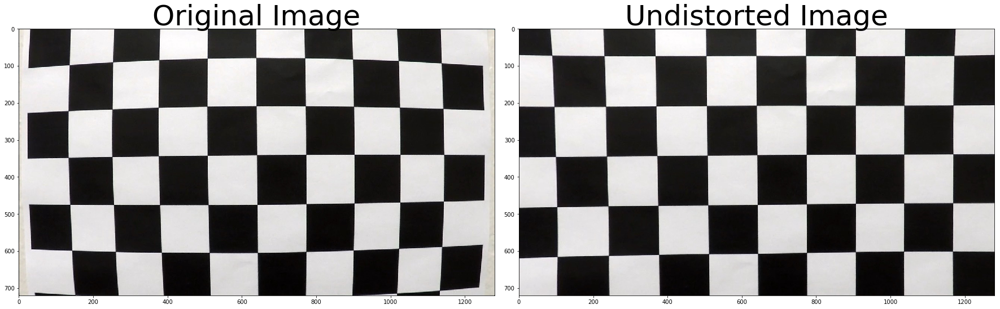

In [4]:
#THIS SECTION IS MEANT TO READ IN ONE OF THE CALIBRATION IMAGES AND TO COMPARE IT WITH ITS UNDISTORTED VERSION
#FOR DEBUG PURPOUSES
calibration_image_test = mpimg.imread('camera_cal/calibration1.jpg')
undistorted_calibration_image_test = remove_img_distortion(calibration_image_test, final_obj_points, final_img_points)
fig = plot_orig_and_undistorted(calibration_image_test, undistorted_calibration_image_test)

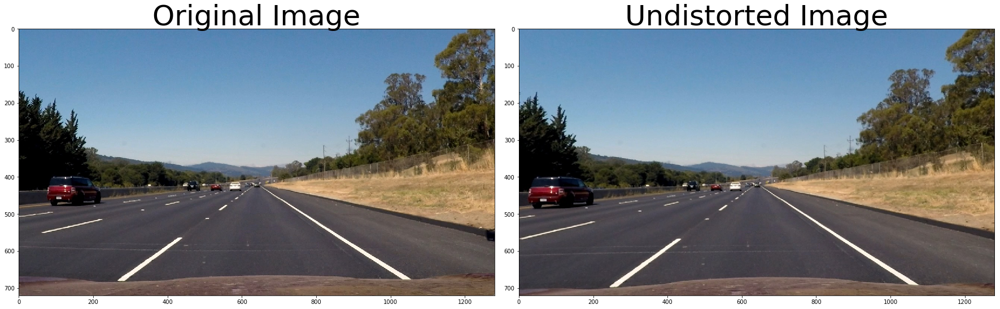

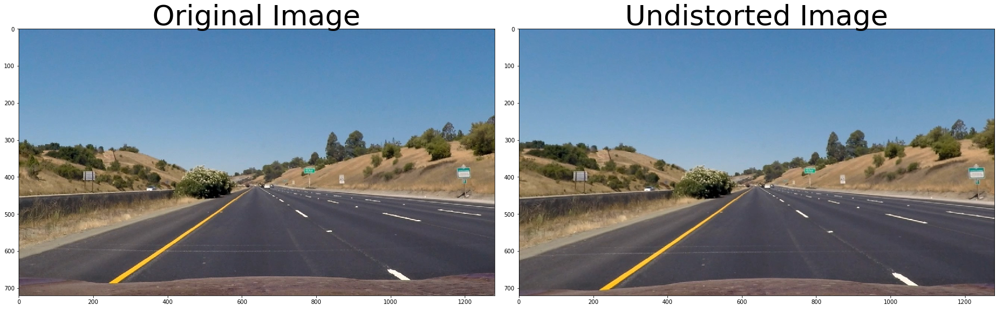

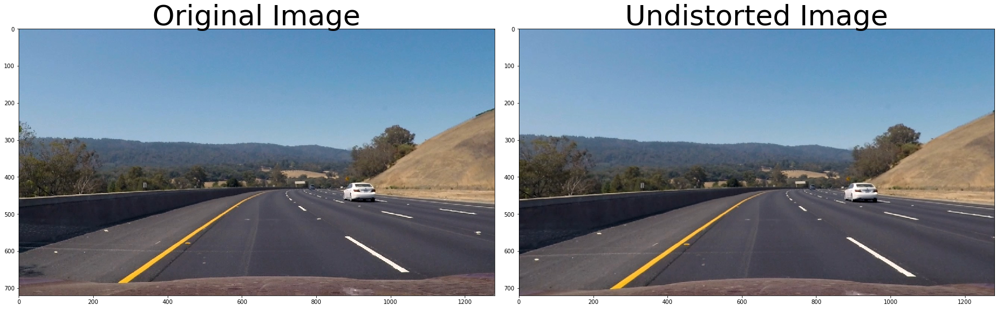

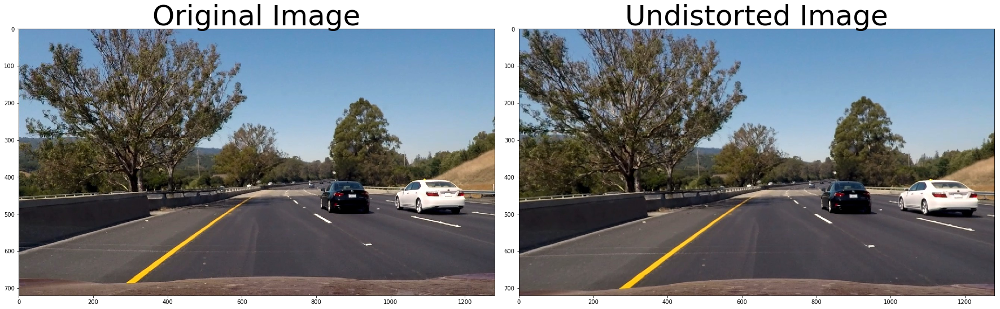

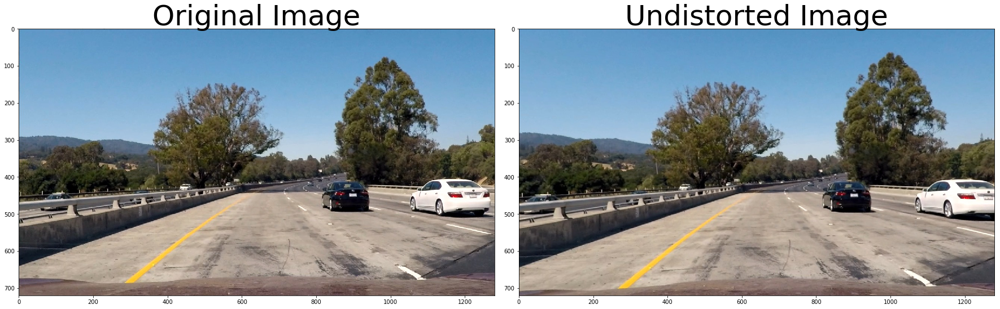

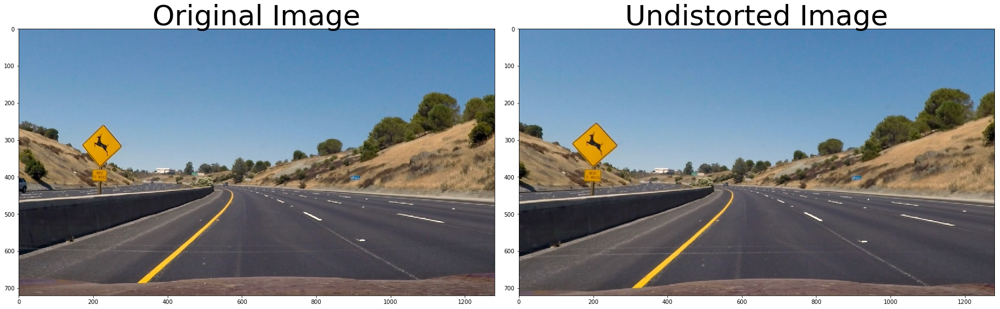

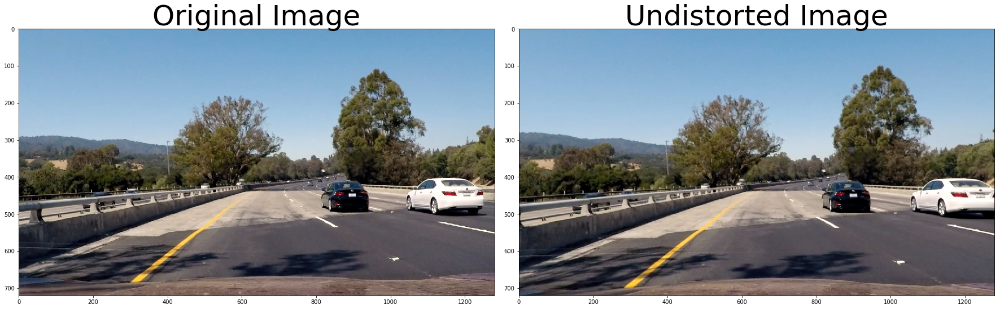

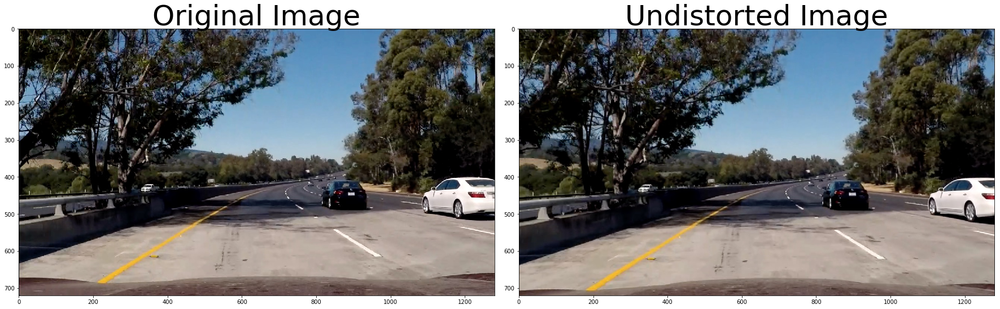

In [5]:
#THIS SECTION IS MEANT TO READ IN ALL THE TEST IMAGES, UNDISTORT THEM AND TO COMPARE THE RESULTS
#HERE I AM ALSO SAVING THE RESULTS IN THE FOLDER 'output_images/'
#NOTE: THIS SECTION REQUIRES SOME TIME TO RUN SO I SPECIFIED A FLAG

#Specify whether we want to compare and save the results in a plot, if yes do it
show_and_save_undistorted_test_images = True

straight_images_undistorted = []
straight_images = glob.glob('test_images/straight_lines*.jpg')
straight_image_index = 0
for current_straight_image in straight_images:
    img_straight = mpimg.imread(current_straight_image)
    undistorted_image_straight = remove_img_distortion(img_straight, final_obj_points, final_img_points)
    straight_images_undistorted.append(undistorted_image_straight) #TODO:SEE IF U CAN ACCESS THEN AS NOMRAL IMAGES
    if show_and_save_undistorted_test_images == True:
        fig_straight = plot_orig_and_undistorted(img_straight, undistorted_image_straight, straight_image_index)
        fig_straight.savefig('output_images/OrigVsUndistortedStraight'+str(straight_image_index)+'.png') 
    straight_image_index = straight_image_index + 1

test_images_undistorted = []
test_images = glob.glob('test_images/test*.jpg')
test_image_index = 0
for current_test_image in test_images:
    img_test = mpimg.imread(current_test_image)
    undistorted_image_test = remove_img_distortion(img_test, final_obj_points, final_img_points)
    test_images_undistorted.append(undistorted_image_test) #TODO:SEE IF U CAN ACCESS THEN AS NOMRAL IMAGES
    if show_and_save_undistorted_test_images == True:
        fig_test = plot_orig_and_undistorted(img_test, undistorted_image_test, test_image_index)
        fig_test.savefig('output_images/OrigVsUndistortedTest'+str(test_image_index)+'.png') 
    test_image_index = test_image_index + 1



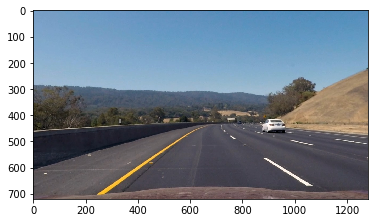

In [6]:
#HERE I HAVE ALL THE UNDISTORTED IMAGES IN A LIST AND I CAN GO ON WITH THE PROCESSING OF THE IMAGES

plt.imshow(straight_images_undistorted[1])
plt.imshow(test_images_undistorted[0])